In [1]:
import pandas as pd
import numpy as np
from sklearn.cluster import DBSCAN, AgglomerativeClustering, OPTICS
from sklearn.metrics.cluster import (homogeneity_score, silhouette_score, davies_bouldin_score,
                                     adjusted_rand_score, calinski_harabasz_score, adjusted_mutual_info_score,
                                     v_measure_score, completeness_score)

from sklearn.datasets import make_moons
from collections import defaultdict
import itertools

import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

In [2]:
pd.set_option('display.max.rows', None)

## Generate toy dataset

In [3]:
dataset = make_moons(n_samples=2000, noise=0.75)

In [4]:
data, labels = dataset

# Baseline algorithms

In [5]:
clustering_algorithms = (DBSCAN, AgglomerativeClustering, OPTICS)
clustering_algorithms_titles = ('DBSCAN', 'AgglomerativeClustering', 'OPTICS')
clustering_metrics = (homogeneity_score, silhouette_score, davies_bouldin_score, adjusted_rand_score, 
                      calinski_harabasz_score, adjusted_mutual_info_score, v_measure_score, completeness_score)
clustering_metrics_titles = ('homogeneity_score', 'silhouette_score', 'davies_bouldin_score',
                             'adjusted_rand_index', 'calinski_harabasz_score', 'adjusted_mutual_info',
                             'v_measure_score', 'completeness_score'
                            )

### Calculate metrics for each algorithm

In [6]:
labels_mapping = {}

metrics_dataframe = pd.DataFrame(index=clustering_algorithms_titles, columns=clustering_metrics_titles)

for clustering_algorithm, clustering_algorithms_title in zip(clustering_algorithms, clustering_algorithms_titles):
    algorithm = clustering_algorithm()
    tmp_predictions = algorithm.fit_predict(data)
    
    labels_mapping[clustering_algorithms_title] = tmp_predictions
    
    for metric, metric_title in zip(clustering_metrics, clustering_metrics_titles):
        if metric_title not in ('silhouette_score', 'davies_bouldin_score', 'calinski_harabasz_score'):
            metrics_dataframe.loc[clustering_algorithms_title, metric_title] = metric(labels, tmp_predictions)
        else:
            metrics_dataframe.loc[clustering_algorithms_title, metric_title] = metric(data, labels)

In [7]:
metrics_dataframe.index.name = 'clustering_algorithm'
metrics_dataframe

,homogeneity_score,silhouette_score,davies_bouldin_score,adjusted_rand_index,calinski_harabasz_score,adjusted_mutual_info,v_measure_score,completeness_score
clustering_algorithm,,,,,,,,
DBSCAN,0,0.134101,1.97292,-7.97205e-06,408.465,-0.000752646,0,0
AgglomerativeClustering,0.115096,0.134101,1.97292,0.153244,408.465,0.11516,0.11548,0.115867
OPTICS,0.141913,0.134101,1.97292,0.00101,408.465,0.0378084,0.0549031,0.0340353


In [8]:
def highlight_min(data, color='yellow'):
    attr = 'background-color: {}'.format(color)
    data = data.replace('%','', regex=True).astype(float)
    if data.ndim == 1:
        bound = data == data.min() 
        return [attr if row else '' for row in bound]
    else:
        bound = data == data.min().min()  
        return pd.DataFrame(np.where(bound, attr, ''), index=data.index, columns=data.columns)
    
def highlight_max(data, color='yellow'):
    attr = 'background-color: {}'.format(color)
    data = data.replace('%','', regex=True).astype(float)
    if data.ndim == 1:
        bound = data == data.max() 
        return [attr if row else '' for row in bound]
    else:
        bound = data == data.max().max()  
        return pd.DataFrame(np.where(bound, attr, ''), index=data.index, columns=data.columns)

In [9]:
metrics_best_mapping = {'davies_bouldin_score': highlight_min,
                       'calinski_harabasz_score': highlight_max,
                       'silhouette_score': highlight_max,
                       'homogeneity_score': highlight_max,
                       'adjusted_rand_index': highlight_max,
                       'adjusted_mutual_info': highlight_max,
                       'v_measure_score': highlight_max,
                       'completeness_score': highlight_max
                       }

metrics_min = ['davies_bouldin_score']
metrics_max = list(set(clustering_metrics_titles) - set(metrics_min))

### Find best algorithms for each metric of clusterization

#### Davies_bouldin_score we have to minimize

In [10]:
metrics_dataframe[metrics_min].style.apply(highlight_min)

,davies_bouldin_score
clustering_algorithm,
DBSCAN,1.972918
AgglomerativeClustering,1.972918
OPTICS,1.972918


#### Other metrics we have to maximize

In [11]:
metrics_dataframe[metrics_max].style.apply(highlight_max)

,homogeneity_score,v_measure_score,completeness_score,adjusted_mutual_info,adjusted_rand_index,calinski_harabasz_score,silhouette_score
clustering_algorithm,,,,,,,
DBSCAN,0.000000,0.000000,0.000000,-0.000753,-0.000008,408.464819,0.134101
AgglomerativeClustering,0.115096,0.115480,0.115867,0.115160,0.153244,408.464819,0.134101
OPTICS,0.141913,0.054903,0.034035,0.037808,0.001010,408.464819,0.134101


Agglomerative Clustering seems to be the best algorithm, according to clusterization metrics

### Vizualize clusters for each method

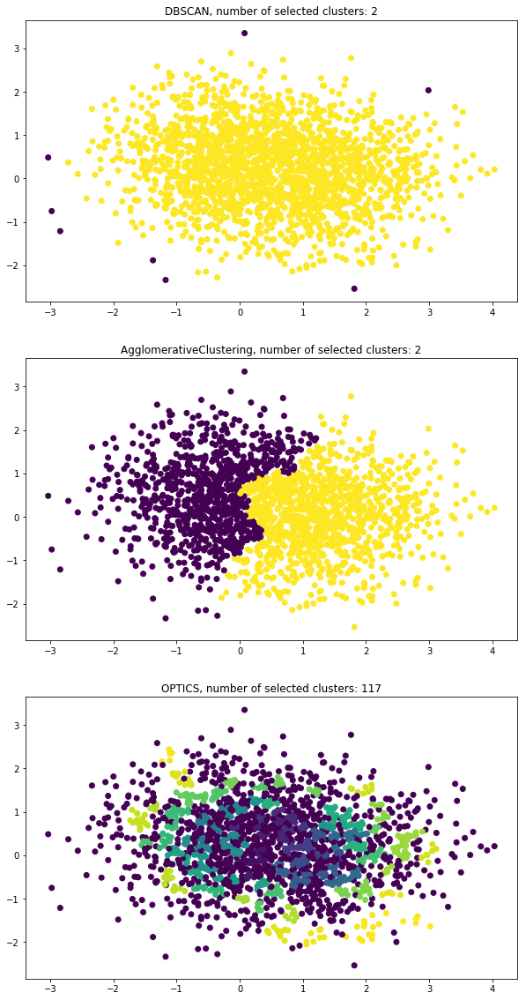

In [12]:
fig, axs = plt.subplots(nrows=len(clustering_algorithms_titles), ncols=1, figsize=(10, 20))

idx = 0

for clustering_algorithm, labels in labels_mapping.items():
    colors_mapping = [(item/255.) for item in labels]
    axs[idx].scatter(data[:, 0], data[:, 1], c=colors_mapping);
    axs[idx].set_title('{}, number of selected clusters: {}'.format(clustering_algorithm, len(set(labels))))
    
    idx += 1

According to visualisation's results we can say that the best algorithm for clustering is Agglomerative Clustering.          

Thus we consider that the best metrics for evaluate clustering are v_measure_score, completeness_score, adjusted_mutual_info and adjusted_rand_index.

# Experiments with parameters

## DBSCAN

#### Experiments with min samples, metric and epsilon

In [37]:
min_samples_range = range(2, 10)
distance_metrics = ('euclidean', 'l1', 'l2', 'manhattan', 'cosine', 'chebyshev')
epsilons_range = (1e-5, 1e-4, 1e-3, 0.01, 0.1)

In [38]:
dbscan_clustering_labels_mapping = {eps: {metrics: {samples: None for samples in min_samples_range} 
                                     for metrics in distance_metrics} 
                                    for eps in epsilons_range}


index = pd.MultiIndex.from_product((min_samples_range, distance_metrics, epsilons_range))

metrics_dataframe_dbscan = pd.DataFrame(index=index, columns=clustering_metrics_titles)

In [39]:
for min_samples, distance_metric, epsilon in itertools.product(min_samples_range, distance_metrics, epsilons_range):
    algorithm = DBSCAN(min_samples=min_samples, metric=distance_metric, eps=epsilon)
    dbscan_predictions = algorithm.fit_predict(data)
    
    dbscan_clustering_labels_mapping[epsilon][distance_metric][min_samples] = dbscan_predictions
    
    for metric, metric_title in zip(clustering_metrics, clustering_metrics_titles):
        if metric_title not in ('silhouette_score', 'davies_bouldin_score', 'calinski_harabasz_score'):
            metrics_dataframe_dbscan.loc[(min_samples, distance_metric, epsilon), metric_title] = metric(
                labels, dbscan_predictions)
        else:
            metrics_dataframe_dbscan.loc[(min_samples, distance_metric, epsilon), metric_title] = metric(data, labels)

In [40]:
metrics_dataframe_dbscan.index.names = ['min_samples', 'metrics', 'epsilon']
metrics_dataframe_dbscan

homogeneity_score silhouette_score  \
min_samples metrics   epsilon                                      
2           euclidean 0.00001      -8.40311e-18        -0.209239   
                      0.00010      -8.40311e-18        -0.209239   
                      0.00100        0.00212968        -0.209239   
                      0.01000         0.0597561        -0.209239   
                      0.10000          0.331754        -0.209239   
            l1        0.00001      -8.40311e-18        -0.209239   
                      0.00010      -8.40311e-18        -0.209239   
                      0.00100        0.00212968        -0.209239   
                      0.01000         0.0401821        -0.209239   
                      0.10000          0.578801        -0.209239   
            l2        0.00001      -8.40311e-18        -0.209239   
                      0.00010      -8.40311e-18        -0.209239   
                      0.00100        0.00212968        -0.209239   
                      0.01000         0.0597561        -0.209239   
                      0.10000          0.331754        -0.209239   
            manhattan 0.00001      -8.40311e-18        -0.209239   
                      0.00010      -8.40311e-18        -0.209239   
                      0.00100        0.00212968        -0.209239   
                      0.01000         0.0401821        -0.209239   
                      0.10000          0.578801        -0.209239   
            cosine    0.00001          0.611106        -0.209239   
                      0.00010          0.289466        -0.209239   
                      0.00100      -8.40311e-18        -0.209239   
                      0.01000      -8.40311e-18        -0.209239   
                      0.10000      -8.40311e-18        -0.209239   
            chebyshev 0.00001      -8.40311e-18        -0.209239   
                      0.00010      -8.40311e-18        -0.209239   
                      0.00100        0.00212968        -0.209239   
                      0.01000         0.0685236        -0.209239   
                      0.10000          0.188671        -0.209239   
3           euclidean 0.00001      -8.40311e-18        -0.209239   
                      0.00010      -8.40311e-18        -0.209239   
                      0.00100      -8.40311e-18        -0.209239   
                      0.01000      -8.40311e-18        -0.209239   
                      0.10000          0.309783        -0.209239   
            l1        0.00001      -8.40311e-18        -0.209239   
                      0.00010      -8.40311e-18        -0.209239   
                      0.00100      -8.40311e-18        -0.209239   
                      0.01000      -8.40311e-18        -0.209239   
                      0.10000          0.535455        -0.209239   
            l2        0.00001      -8.40311e-18        -0.209239   
                      0.00010      -8.40311e-18        -0.209239   
                      0.00100      -8.40311e-18        -0.209239   
                      0.01000      -8.40311e-18        -0.209239   
                      0.10000          0.309783        -0.209239   
            manhattan 0.00001      -8.40311e-18        -0.209239   
                      0.00010      -8.40311e-18        -0.209239   
                      0.00100      -8.40311e-18        -0.209239   
                      0.01000      -8.40311e-18        -0.209239   
                      0.10000          0.535455        -0.209239   
            cosine    0.00001          0.545079        -0.209239   
                      0.00010          0.288982        -0.209239   
                      0.00100      -8.40311e-18        -0.209239   
                      0.01000      -8.40311e-18        -0.209239   
                      0.10000      -8.40311e-18        -0.209239   
            chebyshev 0.00001      -8.40311e-18        -0.209239   
                      0.00010      -8.40311e-18        -0.209239   
                  

### Find best parameters for DBSCAN Clustering

#### Davies_bouldin_score we have to minimize

In [41]:
metrics_dataframe_dbscan[metrics_min].style.apply(highlight_min)

#### Other metrics we have to maximize

In [42]:
metrics_dataframe_dbscan[metrics_max].style.apply(highlight_max)

Seems like epsilon 0.1 with 4 clusters and L1 or 5 clusters and manhattan metrics are the best for DBSCAN algorithm

## OPTICS

#### Experiments with min samples, metric and epsilon

In [43]:
min_samples_range = range(2, 10)
distance_metrics = ('euclidean', 'l1', 'l2', 'manhattan', 'cosine', 'chebyshev')

epsilons_range = (1e-5, 1e-4, 1e-3, 0.01, 0.1)

In [44]:
optics_clustering_labels_mapping = {eps: {metrics: {samples: None for samples in min_samples_range} 
                                     for metrics in distance_metrics} 
                                    for eps in epsilons_range}

index = pd.MultiIndex.from_product((min_samples_range, distance_metrics, epsilons_range))

metrics_dataframe_optics = pd.DataFrame(index=index, columns=clustering_metrics_titles)


In [45]:
for min_samples, distance_metric, epsilon in itertools.product(min_samples_range, distance_metrics, epsilons_range):
    algorithm = OPTICS(min_samples=min_samples, metric=distance_metric, eps=epsilon)
    optics_predictions = algorithm.fit_predict(data)
    
    optics_clustering_labels_mapping[epsilon][distance_metric][min_samples] = optics_predictions
    
    for metric, metric_title in zip(clustering_metrics, clustering_metrics_titles):
        if metric_title not in ('silhouette_score', 'davies_bouldin_score', 'calinski_harabasz_score'):
            metrics_dataframe_optics.loc[(min_samples, distance_metric, epsilon), metric_title] = metric(
                labels, optics_predictions)
        else:
            metrics_dataframe_optics.loc[(min_samples, distance_metric, epsilon), metric_title] = metric(data, labels)

In [46]:
metrics_dataframe_optics.index.names = ['min_samples', 'metrics', 'epsilon']
metrics_dataframe_optics

homogeneity_score silhouette_score  \
min_samples metrics   epsilon                                      
2           euclidean 0.00001          0.835575        -0.209239   
                      0.00010          0.835575        -0.209239   
                      0.00100          0.835575        -0.209239   
                      0.01000          0.835575        -0.209239   
                      0.10000          0.835575        -0.209239   
            l1        0.00001          0.819782        -0.209239   
                      0.00010          0.819782        -0.209239   
                      0.00100          0.819782        -0.209239   
                      0.01000          0.819782        -0.209239   
                      0.10000          0.819782        -0.209239   
            l2        0.00001          0.835575        -0.209239   
                      0.00010          0.835575        -0.209239   
                      0.00100          0.835575        -0.209239   
                      0.01000          0.835575        -0.209239   
                      0.10000          0.835575        -0.209239   
            manhattan 0.00001          0.819782        -0.209239   
                      0.00010          0.819782        -0.209239   
                      0.00100          0.819782        -0.209239   
                      0.01000          0.819782        -0.209239   
                      0.10000          0.819782        -0.209239   
            cosine    0.00001          0.727347        -0.209239   
                      0.00010          0.727347        -0.209239   
                      0.00100          0.727347        -0.209239   
                      0.01000          0.727347        -0.209239   
                      0.10000          0.727347        -0.209239   
            chebyshev 0.00001          0.837425        -0.209239   
                      0.00010          0.837425        -0.209239   
                      0.00100          0.837425        -0.209239   
                      0.01000          0.837425        -0.209239   
                      0.10000          0.837425        -0.209239   
3           euclidean 0.00001           0.72365        -0.209239   
                      0.00010           0.72365        -0.209239   
                      0.00100           0.72365        -0.209239   
                      0.01000           0.72365        -0.209239   
                      0.10000           0.72365        -0.209239   
            l1        0.00001          0.749542        -0.209239   
                      0.00010          0.749542        -0.209239   
                      0.00100          0.749542        -0.209239   
                      0.01000          0.749542        -0.209239   
                      0.10000          0.749542        -0.209239   
            l2        0.00001           0.72365        -0.209239   
                      0.00010           0.72365        -0.209239   
                      0.00100           0.72365        -0.209239   
                      0.01000           0.72365        -0.209239   
                      0.10000           0.72365        -0.209239   
            manhattan 0.00001          0.749542        -0.209239   
                      0.00010          0.749542        -0.209239   
                      0.00100          0.749542        -0.209239   
                      0.01000          0.749542        -0.209239   
                      0.10000          0.749542        -0.209239   
            cosine    0.00001          0.601349        -0.209239   
                      0.00010          0.601349        -0.209239   
                      0.00100          0.601349        -0.209239   
                      0.01000          0.601349        -0.209239   
                      0.10000          0.601349        -0.209239   
            chebyshev 0.00001          0.752441        -0.209239   
                      0.00010          0.752441        -0.209239   
                  

### Find best parameters for OPTICS Clustering

#### Davies_bouldin_score we have to minimize

In [47]:
metrics_dataframe_optics[metrics_min].style.apply(highlight_min)

#### Other metrics we have to maximize

In [48]:
metrics_dataframe_optics[metrics_max].style.apply(highlight_max)

Seems like 4 clusters and Euclidean or L2 are the best for OPTICS algorithm. Epsilon doesn't influence on change metrics values.

## Agglomerative Clustering

#### Experiments with number of clusters and distance metrics

In [49]:
clusters_range = range(2, 10)
distance_metrics = ('euclidean', 'l1', 'l2', 'manhattan', 'cosine')

In [50]:
agglomerative_clustering_labels_mapping = defaultdict(dict)

index = pd.MultiIndex.from_product((clusters_range, distance_metrics))

metrics_dataframe_agglomerative = pd.DataFrame(index=index, columns=clustering_metrics_titles)

In [51]:
for nclusters, distance_metric in itertools.product(clusters_range, distance_metrics):
    algorithm = AgglomerativeClustering(n_clusters=nclusters, affinity=distance_metric, linkage='average')
    agglomerative_predictions = algorithm.fit_predict(data)
    
    agglomerative_clustering_labels_mapping[nclusters][distance_metric] = agglomerative_predictions
    
    for metric, metric_title in zip(clustering_metrics, clustering_metrics_titles):
        if metric_title not in ('silhouette_score', 'davies_bouldin_score', 'calinski_harabasz_score'):
            metrics_dataframe_agglomerative.loc[(nclusters, distance_metric), metric_title] = metric(
                labels, agglomerative_predictions)
        else:
            metrics_dataframe_agglomerative.loc[(nclusters, distance_metric), metric_title] = metric(data, labels)

In [52]:
metrics_dataframe_agglomerative.index.names = ['nclusters', 'affinity']
metrics_dataframe_agglomerative

homogeneity_score silhouette_score davies_bouldin_score  \
nclusters affinity                                                            
2         euclidean       0.000437997        -0.209239              1.65569   
          l1              0.000218846        -0.209239              1.65569   
          l2              0.000437997        -0.209239              1.65569   
          manhattan       0.000218846        -0.209239              1.65569   
          cosine             0.104759        -0.209239              1.65569   
3         euclidean         0.0158739        -0.209239              1.65569   
          l1                 0.112308        -0.209239              1.65569   
          l2                0.0158739        -0.209239              1.65569   
          manhattan          0.112308        -0.209239              1.65569   
          cosine             0.126093        -0.209239              1.65569   
4         euclidean         0.0180388        -0.209239              1.65569   
          l1                 0.144623        -0.209239              1.65569   
          l2                0.0180388        -0.209239              1.65569   
          manhattan          0.144623        -0.209239              1.65569   
          cosine             0.192417        -0.209239              1.65569   
5         euclidean          0.126127        -0.209239              1.65569   
          l1                 0.179476        -0.209239              1.65569   
          l2                 0.126127        -0.209239              1.65569   
          manhattan          0.179476        -0.209239              1.65569   
          cosine             0.223445        -0.209239              1.65569   
6         euclidean          0.164104        -0.209239              1.65569   
          l1                 0.180344        -0.209239              1.65569   
          l2                 0.164104        -0.209239              1.65569   
          manhattan          0.180344        -0.209239              1.65569   
          cosine             0.255218        -0.209239              1.65569   
7         euclidean          0.170644        -0.209239              1.65569   
          l1                 0.180879        -0.209239              1.65569   
          l2                 0.170644        -0.209239              1.65569   
          manhattan          0.180879        -0.209239              1.65569   
          cosine             0.266096        -0.209239              1.65569   
8         euclidean          0.207004        -0.209239              1.65569   
          l1                 0.214953        -0.209239              1.65569   
          l2                 0.207004        -0.209239              1.65569   
          manhattan          0.214953        -0.209239              1.65569   
          cosine             0.292581        -0.209239              1.65569   
9         euclidean          0.227325        -0.209239              1.65569   
          l1                 0.252884        -0.209239              1.65569   
          l2                 0.227325        -0.209239              1.65569   
          manhattan          0.252884        -0.209239              1.65569   
          cosine             0.311223        -0.209239              1.65569   

                    adjusted_rand_index calinski_harabasz_score  \
nclusters affinity                                                
2         euclidean         -0.00275536                 10.6631   
          l1                -0.00138003                 10.6631   
          l2                -0.00275536                 10.6631   
          manhattan         -0.00138003                 10.6631   
          cosine            -0.00717091                 10.6631   
3         euclidean         -0.00356124                 10.6631   
          l1                  0.0019127                 10.6631   
          l2                -0.00356124                 10.6631   
          manhattan           0

### Find best nclusters and affinity for Agglomerative Clustering

#### Davies_bouldin_score we have to minimize

In [53]:
metrics_dataframe_agglomerative[metrics_min].style.apply(highlight_min)

#### Other metrics we have to maximize

In [54]:
metrics_dataframe_agglomerative[metrics_max].style.apply(highlight_max)

Seems like 9 clusters and cosine are the best for Agglomerative Clustering algorithm

### Vizualize clusters for each parameter

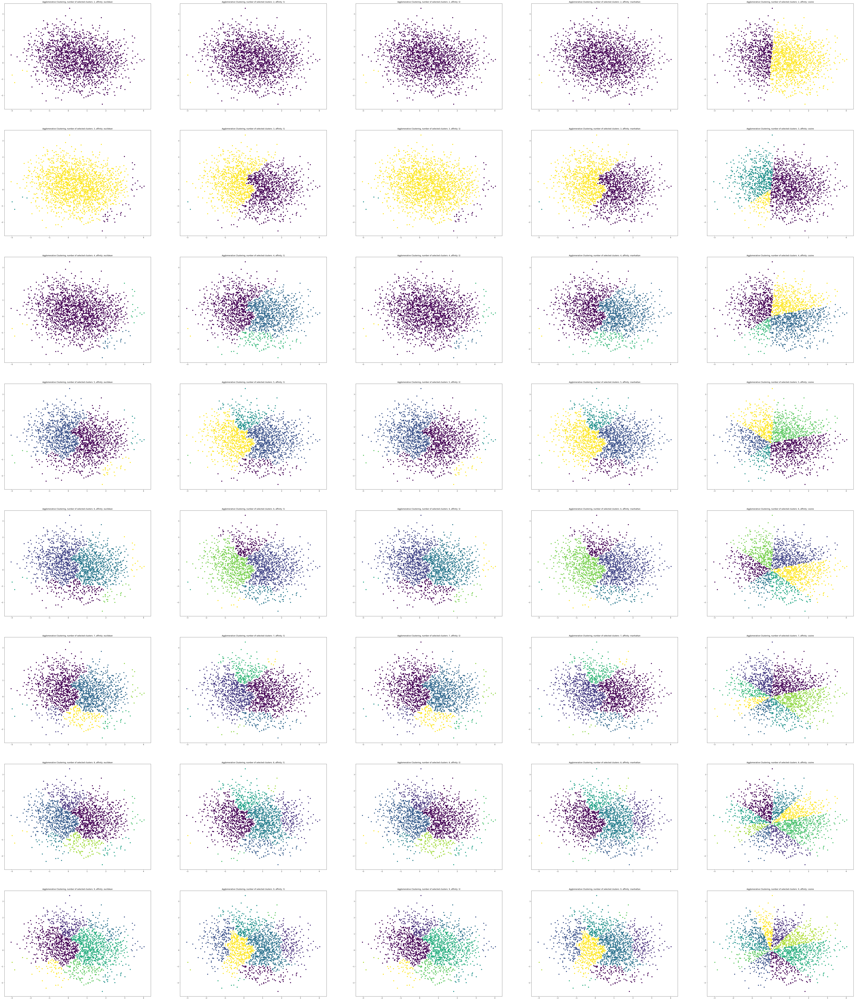

In [55]:
fig, axs = plt.subplots(nrows=len(clusters_range), ncols=len(distance_metrics), figsize=(100, 120))

idx = 0

for i, data_agg in enumerate(agglomerative_clustering_labels_mapping.items()):
    nclusters, data_dict = data_agg
    for j, data_agg1 in enumerate(data_dict.items()):
        affinity, labels = data_agg1
        colors_mapping = [(item/255.) for item in labels]
        axs[i][j].scatter(data[:, 0], data[:, 1], c=colors_mapping);
        axs[i][j].set_title('Agglomerative Clustering, number of selected clusters: {}, affinity: {}'.format(
            nclusters, affinity))

# Dataset 2

## dataset for task about heart attack 

In [70]:
from sklearn.decomposition import PCA

In [72]:
dataset2 = pd.read_csv('heart.csv')

In [73]:
dataset2.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2,1
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2,1
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2,1
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2,1


In [74]:
dataset_task2 = dataset2.iloc[:,0:-1]
dataset_task2.shape

(297, 13)

In [75]:
labels = dataset2['target']

In [76]:
pca = PCA(n_components=2)

In [77]:
dataset_2d = pca.fit_transform(dataset_task2)

### Calculate metrics for each algorithm

In [78]:
labels_mapping = {}

metrics_dataframe = pd.DataFrame(index=clustering_algorithms_titles, columns=clustering_metrics_titles)

for clustering_algorithm, clustering_algorithms_title in zip(clustering_algorithms, clustering_algorithms_titles):
    algorithm = clustering_algorithm()
    tmp_predictions = algorithm.fit_predict(dataset_2d)
    
    labels_mapping[clustering_algorithms_title] = tmp_predictions
    
    for metric, metric_title in zip(clustering_metrics, clustering_metrics_titles):
        if metric_title not in ('silhouette_score', 'davies_bouldin_score', 'calinski_harabasz_score'):
            metrics_dataframe.loc[clustering_algorithms_title, metric_title] = metric(labels, tmp_predictions)
        else:
            metrics_dataframe.loc[clustering_algorithms_title, metric_title] = metric(dataset_2d, labels)

In [79]:
metrics_dataframe.index.name = 'clustering_algorithm'
metrics_dataframe

,homogeneity_score,silhouette_score,davies_bouldin_score,adjusted_rand_index,calinski_harabasz_score,adjusted_mutual_info,v_measure_score,completeness_score
clustering_algorithm,,,,,,,,
DBSCAN,5.63966e-16,0.0503427,4.06686,0,11.8638,3.47169e-15,1.12793e-15,1
AgglomerativeClustering,0.0211148,0.0503427,4.06686,0.0321577,11.8638,0.0210758,0.023793,0.0272495
OPTICS,0.102684,0.0503427,4.06686,0.0161423,11.8638,0.0285888,0.0530897,0.0357993


### Find best algorithms for each metric of clusterization

#### Davies_bouldin_score we have to minimize

In [80]:
metrics_dataframe[metrics_min].style.apply(highlight_min)

,davies_bouldin_score
clustering_algorithm,
DBSCAN,4.066858
AgglomerativeClustering,4.066858
OPTICS,4.066858


#### Other metrics we have to maximize

In [81]:
metrics_dataframe[metrics_max].style.apply(highlight_max)

,homogeneity_score,v_measure_score,completeness_score,adjusted_mutual_info,adjusted_rand_index,calinski_harabasz_score,silhouette_score
clustering_algorithm,,,,,,,
DBSCAN,0.000000,0.000000,1.000000,0.000000,0.000000,11.863777,0.050343
AgglomerativeClustering,0.021115,0.023793,0.027249,0.021076,0.032158,11.863777,0.050343
OPTICS,0.102684,0.053090,0.035799,0.028589,0.016142,11.863777,0.050343


OPTICS seems to be the best algorithm, according to clusterization metrics

### Vizualize clusters for each method

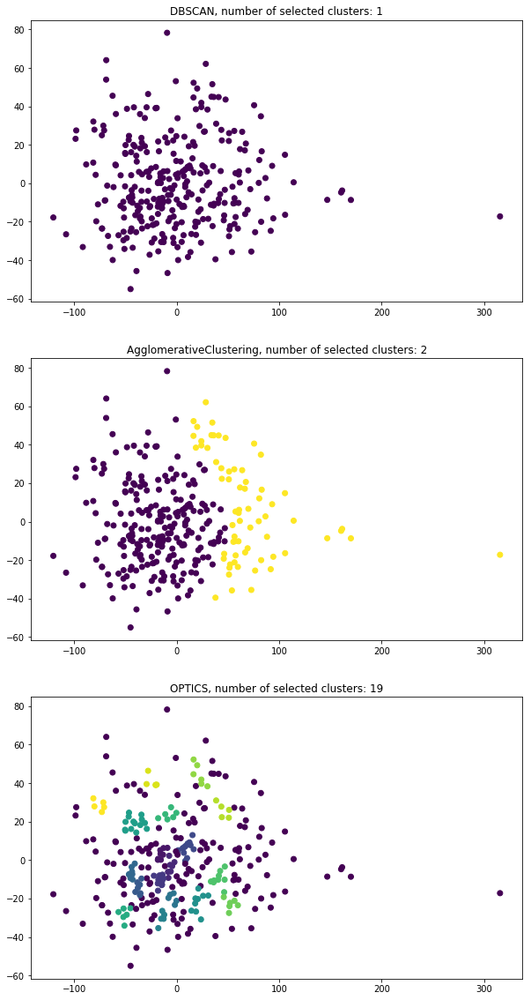

In [82]:
fig, axs = plt.subplots(nrows=len(clustering_algorithms_titles), ncols=1, figsize=(10, 20))

idx = 0

for clustering_algorithm, labels in labels_mapping.items():
    colors_mapping = [(item/255.) for item in labels]
    axs[idx].scatter(dataset_2d[:, 0], dataset_2d[:, 1], c=colors_mapping);
    axs[idx].set_title('{}, number of selected clusters: {}'.format(clustering_algorithm, len(set(labels))))
    
    idx += 1

According to this visualisation we can say that the best algorithm is Agglomerative Clustering, such as we know that this task have to have only two clusters.                                                                                              

Thus we consider that the best metrics is adjusted_rand_index.

# Experiments with parameters

## DBSCAN

#### Experiments with min samples, metric and epsilon

In [83]:
min_samples_range = range(2, 10)
distance_metrics = ('euclidean', 'l1', 'l2', 'manhattan', 'cosine', 'chebyshev')
epsilons_range = (1e-5, 1e-4, 1e-3, 0.01, 0.1)

In [84]:
dbscan_clustering_labels_mapping = {eps: {metrics: {samples: None for samples in min_samples_range} 
                                     for metrics in distance_metrics} 
                                    for eps in epsilons_range}


index = pd.MultiIndex.from_product((min_samples_range, distance_metrics, epsilons_range))

metrics_dataframe_dbscan = pd.DataFrame(index=index, columns=clustering_metrics_titles)

In [85]:
for min_samples, distance_metric, epsilon in itertools.product(min_samples_range, distance_metrics, epsilons_range):
    algorithm = DBSCAN(min_samples=min_samples, metric=distance_metric, eps=epsilon)
    dbscan_predictions = algorithm.fit_predict(dataset_2d)
    
    dbscan_clustering_labels_mapping[epsilon][distance_metric][min_samples] = dbscan_predictions
    
    for metric, metric_title in zip(clustering_metrics, clustering_metrics_titles):
        if metric_title not in ('silhouette_score', 'davies_bouldin_score', 'calinski_harabasz_score'):
            metrics_dataframe_dbscan.loc[(min_samples, distance_metric, epsilon), metric_title] = metric(
                labels, dbscan_predictions)
        else:
            metrics_dataframe_dbscan.loc[(min_samples, distance_metric, epsilon), metric_title] = metric(dataset_2d, labels)

In [86]:
metrics_dataframe_dbscan.index.names = ['min_samples', 'metrics', 'epsilon']
metrics_dataframe_dbscan

homogeneity_score silhouette_score  \
min_samples metrics   epsilon                                      
2           euclidean 0.00001        0.00207496        -0.134175   
                      0.00010        0.00207496        -0.134175   
                      0.00100        0.00207496        -0.134175   
                      0.01000        0.00207496        -0.134175   
                      0.10000        0.00207496        -0.134175   
            l1        0.00001        0.00207496        -0.134175   
                      0.00010        0.00207496        -0.134175   
                      0.00100        0.00207496        -0.134175   
                      0.01000        0.00207496        -0.134175   
                      0.10000        0.00207496        -0.134175   
            l2        0.00001        0.00207496        -0.134175   
                      0.00010        0.00207496        -0.134175   
                      0.00100        0.00207496        -0.134175   
                      0.01000        0.00207496        -0.134175   
                      0.10000        0.00207496        -0.134175   
            manhattan 0.00001        0.00207496        -0.134175   
                      0.00010        0.00207496        -0.134175   
                      0.00100        0.00207496        -0.134175   
                      0.01000        0.00207496        -0.134175   
                      0.10000        0.00207496        -0.134175   
            cosine    0.00001          0.319239        -0.134175   
                      0.00010          0.555946        -0.134175   
                      0.00100          0.403027        -0.134175   
                      0.01000         0.0179048        -0.134175   
                      0.10000       1.40442e-17        -0.134175   
            chebyshev 0.00001        0.00207496        -0.134175   
                      0.00010        0.00207496        -0.134175   
                      0.00100        0.00207496        -0.134175   
                      0.01000        0.00207496        -0.134175   
                      0.10000        0.00207496        -0.134175   
3           euclidean 0.00001       1.40442e-17        -0.134175   
                      0.00010       1.40442e-17        -0.134175   
                      0.00100       1.40442e-17        -0.134175   
                      0.01000       1.40442e-17        -0.134175   
                      0.10000       1.40442e-17        -0.134175   
            l1        0.00001       1.40442e-17        -0.134175   
                      0.00010       1.40442e-17        -0.134175   
                      0.00100       1.40442e-17        -0.134175   
                      0.01000       1.40442e-17        -0.134175   
                      0.10000       1.40442e-17        -0.134175   
            l2        0.00001       1.40442e-17        -0.134175   
                      0.00010       1.40442e-17        -0.134175   
                      0.00100       1.40442e-17        -0.134175   
                      0.01000       1.40442e-17        -0.134175   
                      0.10000       1.40442e-17        -0.134175   
            manhattan 0.00001       1.40442e-17        -0.134175   
                      0.00010       1.40442e-17        -0.134175   
                      0.00100       1.40442e-17        -0.134175   
                      0.01000       1.40442e-17        -0.134175   
                      0.10000       1.40442e-17        -0.134175   
            cosine    0.00001         0.0837301        -0.134175   
                      0.00010          0.357755        -0.134175   
                      0.00100          0.398764        -0.134175   
                      0.01000         0.0179048        -0.134175   
                      0.10000       1.40442e-17        -0.134175   
            chebyshev 0.00001       1.40442e-17        -0.134175   
                      0.00010       1.40442e-17        -0.134175   
                  

### Find best parameters for DBSCAN Clustering

#### Davies_bouldin_score we have to minimize

In [87]:
metrics_dataframe_dbscan[metrics_min].style.apply(highlight_min)

#### Other metrics we have to maximize

In [88]:
metrics_dataframe_dbscan[metrics_max].style.apply(highlight_max)

Seems like 2 clusters, manhattan and epsilon 1e-04 metrics are the best for DBSCAN algorithm

## OPTICS

#### Experiments with min samples, metric and epsilon

In [89]:
min_samples_range = range(2, 10)
distance_metrics = ('euclidean', 'l1', 'l2', 'manhattan', 'cosine', 'chebyshev')

epsilons_range = (1e-5, 1e-4, 1e-3, 0.01, 0.1)

In [90]:
optics_clustering_labels_mapping = {eps: {metrics: {samples: None for samples in min_samples_range} 
                                     for metrics in distance_metrics} 
                                    for eps in epsilons_range}

index = pd.MultiIndex.from_product((min_samples_range, distance_metrics, epsilons_range))

metrics_dataframe_optics = pd.DataFrame(index=index, columns=clustering_metrics_titles)


In [91]:
for min_samples, distance_metric, epsilon in itertools.product(min_samples_range, distance_metrics, epsilons_range):
    algorithm = OPTICS(min_samples=min_samples, metric=distance_metric, eps=epsilon)
    optics_predictions = algorithm.fit_predict(dataset_2d)
    
    optics_clustering_labels_mapping[epsilon][distance_metric][min_samples] = optics_predictions
    
    for metric, metric_title in zip(clustering_metrics, clustering_metrics_titles):
        if metric_title not in ('silhouette_score', 'davies_bouldin_score', 'calinski_harabasz_score'):
            metrics_dataframe_optics.loc[(min_samples, distance_metric, epsilon), metric_title] = metric(
                labels, optics_predictions)
        else:
            metrics_dataframe_optics.loc[(min_samples, distance_metric, epsilon), metric_title] = metric(dataset_2d, labels)

In [92]:
metrics_dataframe_optics.index.names = ['min_samples', 'metrics', 'epsilon']
metrics_dataframe_optics

homogeneity_score silhouette_score  \
min_samples metrics   epsilon                                      
2           euclidean 0.00001          0.821329        -0.134175   
                      0.00010          0.821329        -0.134175   
                      0.00100          0.821329        -0.134175   
                      0.01000          0.821329        -0.134175   
                      0.10000          0.821329        -0.134175   
            l1        0.00001          0.813741        -0.134175   
                      0.00010          0.813741        -0.134175   
                      0.00100          0.813741        -0.134175   
                      0.01000          0.813741        -0.134175   
                      0.10000          0.813741        -0.134175   
            l2        0.00001          0.821329        -0.134175   
                      0.00010          0.821329        -0.134175   
                      0.00100          0.821329        -0.134175   
                      0.01000          0.821329        -0.134175   
                      0.10000          0.821329        -0.134175   
            manhattan 0.00001          0.813741        -0.134175   
                      0.00010          0.813741        -0.134175   
                      0.00100          0.813741        -0.134175   
                      0.01000          0.813741        -0.134175   
                      0.10000          0.813741        -0.134175   
            cosine    0.00001          0.728044        -0.134175   
                      0.00010          0.728044        -0.134175   
                      0.00100          0.728044        -0.134175   
                      0.01000          0.728044        -0.134175   
                      0.10000          0.728044        -0.134175   
            chebyshev 0.00001          0.828795        -0.134175   
                      0.00010          0.828795        -0.134175   
                      0.00100          0.828795        -0.134175   
                      0.01000          0.828795        -0.134175   
                      0.10000          0.828795        -0.134175   
3           euclidean 0.00001          0.684981        -0.134175   
                      0.00010          0.684981        -0.134175   
                      0.00100          0.684981        -0.134175   
                      0.01000          0.684981        -0.134175   
                      0.10000          0.684981        -0.134175   
            l1        0.00001          0.714642        -0.134175   
                      0.00010          0.714642        -0.134175   
                      0.00100          0.714642        -0.134175   
                      0.01000          0.714642        -0.134175   
                      0.10000          0.714642        -0.134175   
            l2        0.00001          0.684981        -0.134175   
                      0.00010          0.684981        -0.134175   
                      0.00100          0.684981        -0.134175   
                      0.01000          0.684981        -0.134175   
                      0.10000          0.684981        -0.134175   
            manhattan 0.00001          0.714642        -0.134175   
                      0.00010          0.714642        -0.134175   
                      0.00100          0.714642        -0.134175   
                      0.01000          0.714642        -0.134175   
                      0.10000          0.714642        -0.134175   
            cosine    0.00001          0.603625        -0.134175   
                      0.00010          0.603625        -0.134175   
                      0.00100          0.603625        -0.134175   
                      0.01000          0.603625        -0.134175   
                      0.10000          0.603625        -0.134175   
            chebyshev 0.00001          0.777668        -0.134175   
                      0.00010          0.777668        -0.134175   
                  

### Find best parameters for OPTICS Clustering

#### Davies_bouldin_score we have to minimize

In [93]:
metrics_dataframe_optics[metrics_min].style.apply(highlight_min)

#### Other metrics we have to maximize

In [94]:
metrics_dataframe_optics[metrics_max].style.apply(highlight_max)

Seems like 4 clusters and Euclidean or L2 are the best for OPTICS algorithm. Epsilon doesn't influence on change metrics values.

## Agglomerative Clustering

#### Experiments with number of clusters and distance metrics

In [95]:
clusters_range = range(2, 10)
distance_metrics = ('euclidean', 'l1', 'l2', 'manhattan', 'cosine')

In [96]:
agglomerative_clustering_labels_mapping = defaultdict(dict)

index = pd.MultiIndex.from_product((clusters_range, distance_metrics))

metrics_dataframe_agglomerative = pd.DataFrame(index=index, columns=clustering_metrics_titles)

In [97]:
for nclusters, distance_metric in itertools.product(clusters_range, distance_metrics):
    algorithm = AgglomerativeClustering(n_clusters=nclusters, affinity=distance_metric, linkage='average')
    agglomerative_predictions = algorithm.fit_predict(dataset_2d)
    
    agglomerative_clustering_labels_mapping[nclusters][distance_metric] = agglomerative_predictions
    
    for metric, metric_title in zip(clustering_metrics, clustering_metrics_titles):
        if metric_title not in ('silhouette_score', 'davies_bouldin_score', 'calinski_harabasz_score'):
            metrics_dataframe_agglomerative.loc[(nclusters, distance_metric), metric_title] = metric(
                labels, agglomerative_predictions)
        else:
            metrics_dataframe_agglomerative.loc[(nclusters, distance_metric), metric_title] = metric(dataset_2d, labels)

In [98]:
metrics_dataframe_agglomerative.index.names = ['nclusters', 'affinity']
metrics_dataframe_agglomerative

homogeneity_score silhouette_score davies_bouldin_score  \
nclusters affinity                                                            
2         euclidean        0.00522406        -0.134175              2.48296   
          l1               0.00522406        -0.134175              2.48296   
          l2               0.00522406        -0.134175              2.48296   
          manhattan        0.00522406        -0.134175              2.48296   
          cosine             0.151762        -0.134175              2.48296   
3         euclidean        0.00522406        -0.134175              2.48296   
          l1               0.00522406        -0.134175              2.48296   
          l2               0.00522406        -0.134175              2.48296   
          manhattan        0.00522406        -0.134175              2.48296   
          cosine             0.215039        -0.134175              2.48296   
4         euclidean        0.00734847        -0.134175              2.48296   
          l1               0.00628373        -0.134175              2.48296   
          l2               0.00734847        -0.134175              2.48296   
          manhattan        0.00628373        -0.134175              2.48296   
          cosine             0.266471        -0.134175              2.48296   
5         euclidean          0.144991        -0.134175              2.48296   
          l1                 0.141932        -0.134175              2.48296   
          l2                 0.144991        -0.134175              2.48296   
          manhattan          0.141932        -0.134175              2.48296   
          cosine             0.298072        -0.134175              2.48296   
6         euclidean          0.147517        -0.134175              2.48296   
          l1                 0.177461        -0.134175              2.48296   
          l2                 0.147517        -0.134175              2.48296   
          manhattan          0.177461        -0.134175              2.48296   
          cosine             0.324893        -0.134175              2.48296   
7         euclidean          0.184109        -0.134175              2.48296   
          l1                 0.179842        -0.134175              2.48296   
          l2                 0.184109        -0.134175              2.48296   
          manhattan          0.179842        -0.134175              2.48296   
          cosine             0.395755        -0.134175              2.48296   
8         euclidean          0.195728        -0.134175              2.48296   
          l1                 0.217021        -0.134175              2.48296   
          l2                 0.195728        -0.134175              2.48296   
          manhattan          0.217021        -0.134175              2.48296   
          cosine             0.400672        -0.134175              2.48296   
9         euclidean          0.233819        -0.134175              2.48296   
          l1                 0.229581        -0.134175              2.48296   
          l2                 0.233819        -0.134175              2.48296   
          manhattan          0.229581        -0.134175              2.48296   
          cosine             0.407549        -0.134175              2.48296   

                    adjusted_rand_index calinski_harabasz_score  \
nclusters affinity                                                
2         euclidean          -0.0224533                 4.65201   
          l1                 -0.0224533                 4.65201   
          l2                 -0.0224533                 4.65201   
          manhattan          -0.0224533                 4.65201   
          cosine              0.0259726                 4.65201   
3         euclidean          -0.0226399                 4.65201   
          l1                 -0.0226399                 4.65201   
          l2                 -0.0226399                 4.65201   
          manhattan          -0

### Find best nclusters and affinity for Agglomerative Clustering

#### Davies_bouldin_score we have to minimize

In [99]:
metrics_dataframe_agglomerative[metrics_min].style.apply(highlight_min)

#### Other metrics we have to maximize

In [100]:
metrics_dataframe_agglomerative[metrics_max].style.apply(highlight_max)

Seems like 7 clusters and cosine are the best for Agglomerative Clustering algorithm

### Vizualize clusters for each parameter

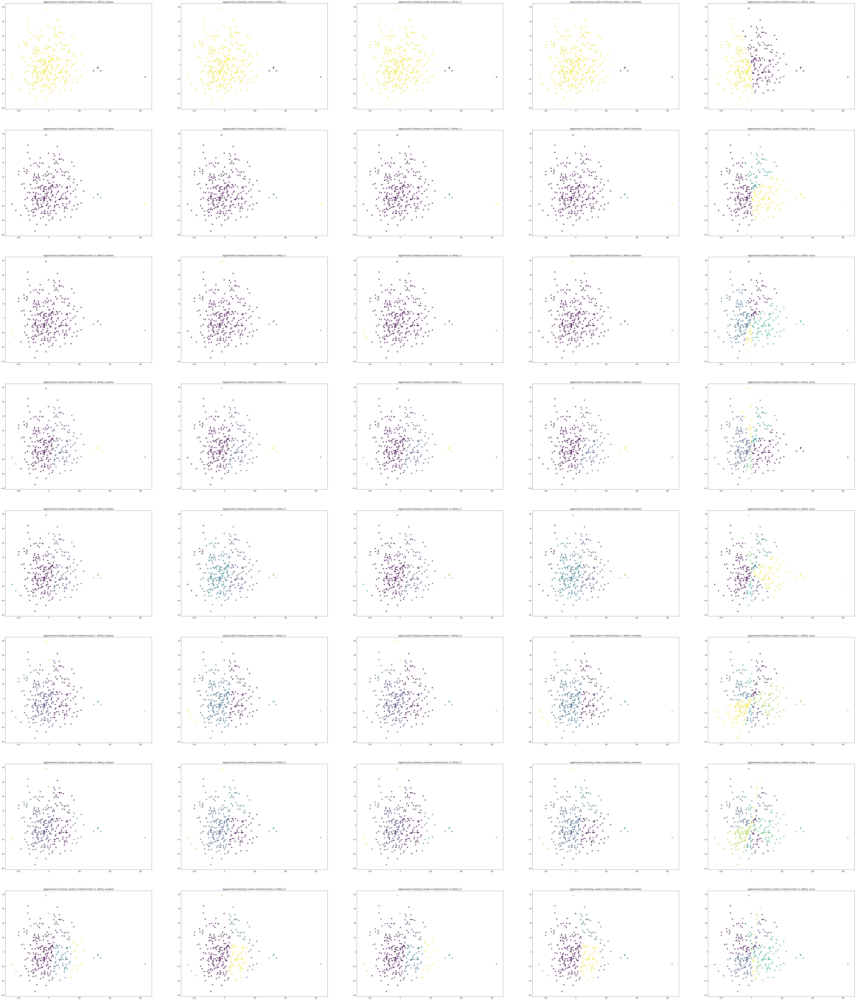

In [101]:
fig, axs = plt.subplots(nrows=len(clusters_range), ncols=len(distance_metrics), figsize=(100, 120))

idx = 0

for i, data_agg in enumerate(agglomerative_clustering_labels_mapping.items()):
    nclusters, data_dict = data_agg
    for j, data_agg1 in enumerate(data_dict.items()):
        affinity, labels = data_agg1
        colors_mapping = [(item/255.) for item in labels]
        axs[i][j].scatter(dataset_2d[:, 0], dataset_2d[:, 1], c=colors_mapping);
        axs[i][j].set_title('Agglomerative Clustering, number of selected clusters: {}, affinity: {}'.format(
            nclusters, affinity))